<a href="https://colab.research.google.com/github/Raymondycp/Analytic_SGTaxi_API/blob/main/%5BAnalytic%5DSGtaxi_API.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploring the API
Acquire data from the https://data.gov.sg API about the availibilty of SG taxi in a range of time

In [ ]:
import datetime
from datetime import datetime
now = datetime.now().strftime('%Y-%m-%dT%H:%M:%S')
timefinal = now
# date = input('Enter date in YYYY-MM-DD')
# time = input('Enter time THH:MIN:SEC')
# timefinal = str(date)+'T'+str(time)

In [ ]:
import requests
import pandas as pd
#Constructing the url for the API for now
url = f"https://api.data.gov.sg/v1/transport/taxi-availability?date_time={timefinal}"
data = requests.get(url).json()
data

{'type': 'FeatureCollection',
 'crs': {'type': 'link',
  'properties': {'href': 'http://spatialreference.org/ref/epsg/4326/ogcwkt/',
   'type': 'ogcwkt'}},
 'features': [{'type': 'Feature',
   'geometry': {'type': 'MultiPoint',
    'coordinates': [[103.6224, 1.2973],
     [103.623630926, 1.2864050806],
     [103.62805, 1.31254],
     [103.62842, 1.29417],
     [103.65484, 1.30299],
     [103.6610571295, 1.3095844812],
     [103.664053157, 1.3078817227],
     [103.66527, 1.30777],
     [103.6697994545, 1.3085638318],
     [103.67054, 1.31501],
     [103.6730375513, 1.3305534536],
     [103.67346, 1.33071],
     [103.67368, 1.33079],
     [103.67441, 1.33117],
     [103.67567, 1.31],
     [103.677880615, 1.3276202416],
     [103.67853145, 1.32728911666667],
     [103.67863905, 1.32734835],
     [103.67928, 1.32713],
     [103.68194, 1.3301],
     [103.68296, 1.3403],
     [103.683, 1.33001],
     [103.68406, 1.33],
     [103.685698016667, 1.34102755],
     [103.68569865, 1.34102773333333

In [ ]:
#Count how many records did I receive
taxilist = data['features'][0]
taxilist.keys()
taxilist = taxilist['geometry']
taxilist.keys()
taxilist = taxilist['coordinates']
record = len(taxilist)
print('Total: '+str(record))

Total: 2285


In [ ]:
# construct a dataframe with the selected section of the json data
df = pd.DataFrame(taxilist)
# df_rename = df.rename('lat':)
df.columns = ['lat','lot']
df

,lat,lot
0,103.622400,1.297300
1,103.623631,1.286405
2,103.628050,1.312540
3,103.628420,1.294170
4,103.654840,1.302990
...,...,...
2280,103.990693,1.357616
2281,103.991049,1.360663
2282,103.995136,1.314307
2283,103.995600,1.375700


Extract the links between 30mins

In [ ]:
# ideas
import time
import requests
import pandas as pd
from datetime import datetime, timedelta
startmoment = datetime(2024, 1, 1, 0, 0, 0) #s
endmoment = datetime(2024, 4, 11, 23, 59, 59) #e
step = timedelta(minutes=30) #stepF

targetmoment = startmoment #now
count = 0
while((targetmoment<endmoment)&(count<3)): #while (now<e):
  print(f'{count}-targetmoment: {targetmoment}')
  print(f'{count}-targetmoment: {targetmoment.strftime("%Y-%m-%dT%H:%M:%S")}')
  print(f'https://api.data.gov.sg/v1/transport/taxi-availability?date_time={targetmoment.strftime("%Y-%m-%dT%H:%M:%S")}')
  print('----')
  targetmoment = targetmoment + step
  count += 1

0-targetmoment: 2024-01-01 00:00:00
0-targetmoment: 2024-01-01T00:00:00
https://api.data.gov.sg/v1/transport/taxi-availability?date_time=2024-01-01T00:00:00
----
1-targetmoment: 2024-01-01 00:30:00
1-targetmoment: 2024-01-01T00:30:00
https://api.data.gov.sg/v1/transport/taxi-availability?date_time=2024-01-01T00:30:00
----
2-targetmoment: 2024-01-01 01:00:00
2-targetmoment: 2024-01-01T01:00:00
https://api.data.gov.sg/v1/transport/taxi-availability?date_time=2024-01-01T01:00:00
----


In [ ]:
# Mini loop thinking, using while loop
s = 5
e = 235
step =30
now = s
while (now<e):
  print(f'now:{now}')
  now = now+step


now:5
now:35
now:65
now:95
now:125
now:155
now:185
now:215


In [ ]:
#using for loop
for now in range(s, e, step):
    print(f'now: {now}')


now: 5
now: 35
now: 65
now: 95
now: 125
now: 155
now: 185
now: 215


In [ ]:
# import time
# import requests
# import pandas as pd
# from datetime import datetime, timedelta

# startmoment = datetime(2024, 1, 1, 0, 0, 0) #s
# endmoment = datetime(2024, 4, 1, 23, 59, 59) # e
# step = timedelta(minutes=30)
# targetmoment = startmoment # now = s

# master_df = pd.DataFrame() # create an empty DF

# count = 0
# while(targetmoment < endmoment
#       #and count < 3
#     ): # while (now < e):
#     # print(f'{count} - targetmoment: {targetmoment}')
#     print(f'{count} - targetmoment: {targetmoment.strftime("%Y-%m-%dT%H:%M:%S")}') # so we need this "T"

#     url = f"https://api.data.gov.sg/v1/transport/taxi-availability?date_time={targetmoment.strftime('%Y-%m-%dT%H:%M:%S')}"

#     data = requests.get(url).json()
#     # print(data, data.keys())

#     lat_list = []
#     lot_list = []
#     try:
#         for taxi in data['features'][0]['geometry']['coordinates']:
#             lat_list.append(taxi[0])
#             lot_list.append(taxi[1])
#     except:
#         ...

#     myDict = {'lat': lat_list, 'lot' : lot_list}
#     df = pd.DataFrame(myDict) # this df changed every loop
#     # display(df)
#     df['date'] = targetmoment.strftime("%Y-%m-%d") # add a new date col to df
#     df['time'] = targetmoment.strftime("%H:%M:%S") # add a new time col to df

#     master_df = pd.concat([master_df, df]) # append df onto master_df

#     print('---0-')

#     targetmoment = targetmoment + step
#     count += 1


# master_df

# Calling the Q1 data by API, Speedup by Multi thread

In [ ]:
import concurrent.futures
import requests
import pandas as pd
from datetime import datetime, timedelta
import time
from tqdm import tqdm  # For progress bars

def generate_time_ranges(start, end, delta):
    """Generate time ranges efficiently"""
    current = start
    while current <= end:
        yield current
        current += delta

def fetch_taxi_data(timestamp, retries=3, timeout=10):
    """Fetch taxi data for a single timestamp with retries"""
    url = f"https://api.data.gov.sg/v1/transport/taxi-availability?date_time={timestamp.strftime('%Y-%m-%dT%H:%M:%S')}"

    for attempt in range(retries):
        try:
            response = requests.get(url, timeout=timeout)
            response.raise_for_status()
            data = response.json()

            # Process coordinates efficiently
            coordinates = data['features'][0]['geometry']['coordinates']
            if not coordinates:
                return None

            # Create DataFrame in one operation
            df = pd.DataFrame(coordinates, columns=['longitude', 'latitude'])
            df['datetime'] = timestamp
            return df

        except requests.exceptions.RequestException as e:
            if attempt == retries - 1:
                print(f"Failed after {retries} attempts for {timestamp}: {str(e)}")
                return timestamp  # Return the failed timestamp instead of None
            time.sleep(2 ** attempt)  # Exponential backoff

def get_taxi_data_concurrent(start_moment, end_moment, step, max_workers=10):
    """Main function to fetch data in parallel"""
    # Generate all timestamps first
    timestamps = list(generate_time_ranges(start_moment, end_moment, step))
    total_requests = len(timestamps)
    print(f"Total API calls to make: {total_requests}")

    results = []
    failed_downloads = []  # List to store failed timestamps

    # Using ThreadPoolExecutor for parallel requests
    with concurrent.futures.ThreadPoolExecutor(max_workers=max_workers) as executor:
        # Create future to timestamp mapping
        future_to_time = {
            executor.submit(fetch_taxi_data, ts): ts
            for ts in timestamps
        }

        # Process results as they complete
        for future in tqdm(concurrent.futures.as_completed(future_to_time),
                          total=total_requests,
                          desc="Fetching data"):
            ts = future_to_time[future]
            try:
                result = future.result()
                if isinstance(result, pd.DataFrame):
                    results.append(result)
                elif result is not None:  # This is a failed timestamp
                    failed_downloads.append(result)
            except Exception as e:
                failed_requests += 1
                failed_downloads.append(ts)
                print(f"Exception for {ts}: {str(e)}")

    # Save failed downloads to a file for later retry
    if failed_downloads:
        failed_df = pd.DataFrame({'failed_timestamps': failed_downloads})
        failed_df.to_csv('failed_downloads.csv', index=False)
        print(f"\nSaved {len(failed_downloads)} failed timestamps to 'failed_downloads.csv'")

    # Combine all results
    if results:
        final_df = pd.concat(results, ignore_index=True)
        print(f"\nSuccessfully fetched {len(final_df)} taxi locations")
        print(f"Failed requests: {len(failed_downloads)}")
        return final_df
    else:
        print("No data was fetched successfully")
        return pd.DataFrame()

def retry_failed_downloads(failed_file='failed_downloads.csv', max_workers=10):
    """Function to retry failed downloads from a file"""
    try:
        failed_df = pd.read_csv(failed_file)
        failed_timestamps = pd.to_datetime(failed_df['failed_timestamps'])
        print(f"Retrying {len(failed_timestamps)} failed downloads...")

        results = []
        new_failures = []

        with concurrent.futures.ThreadPoolExecutor(max_workers=max_workers) as executor:
            future_to_time = {executor.submit(fetch_taxi_data, ts): ts for ts in failed_timestamps}

            for future in tqdm(concurrent.futures.as_completed(future_to_time),
                             total=len(failed_timestamps),
                             desc="Retrying failed downloads"):
                ts = future_to_time[future]
                try:
                    result = future.result()
                    if isinstance(result, pd.DataFrame):
                        results.append(result)
                    elif result is not None:
                        new_failures.append(result)
                except Exception as e:
                    new_failures.append(ts)
                    print(f"Exception for {ts}: {str(e)}")

        # Update failed downloads file with any new failures
        if new_failures:
            new_failed_df = pd.DataFrame({'failed_timestamps': new_failures})
            new_failed_df.to_csv(failed_file, index=False)
            print(f"\n{len(new_failures)} downloads still failed. Updated 'failed_downloads.csv'")
        else:
            import os
            os.remove(failed_file)
            print("\nAll failed downloads succeeded! Removed 'failed_downloads.csv'")

        if results:
            return pd.concat(results, ignore_index=True)
        return pd.DataFrame()

    except FileNotFoundError:
        print("No failed downloads file found")
        return pd.DataFrame()

# Example usage
if __name__ == "__main__":
    start_time = datetime(2024, 1, 1, 0, 0, 0)
    end_time = datetime(2024, 4, 30, 23, 59, 59)
    interval = timedelta(minutes=30)

    # Initial download
    start = time.time()
    taxi_data = get_taxi_data_concurrent(start_time, end_time, interval)
    end = time.time()

    print(f"\nExecution time: {end - start:.2f} seconds")
    print("\nSample data:")
    print(taxi_data.head())

    # Later, to retry failed downloads:
    # taxi_data_retry = retry_failed_downloads()
    # if not taxi_data_retry.empty:
    #     taxi_data = pd.concat([taxi_data, taxi_data_retry]).reset_index(drop=True)

Total API calls to make: 5808


Fetching data: 100%|██████████| 5808/5808 [02:40<00:00, 36.24it/s]



Successfully fetched 10607231 taxi locations
Failed requests: 0

Execution time: 161.95 seconds

Sample data:
    longitude  latitude            datetime
0  103.638980  1.329590 2024-01-01 01:30:00
1  103.661040  1.310780 2024-01-01 01:30:00
2  103.685920  1.340490 2024-01-01 01:30:00
3  103.688144  1.330646 2024-01-01 01:30:00
4  103.688810  1.340000 2024-01-01 01:30:00


In [ ]:
taxi_data.to_csv()

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import time
from tqdm import tqdm

taxi_data=pd.read_csv('/content/taxi_data.csv',index_col=None)

# Processing the data to obtain insight

In [ ]:
taxi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10607231 entries, 0 to 10607230
Data columns (total 3 columns):
 #   Column     Dtype         
---  ------     -----         
 0   longitude  float64       
 1   latitude   float64       
 2   datetime   datetime64[us]
dtypes: datetime64[us](1), float64(2)
memory usage: 242.8 MB


In [ ]:
taxi_data['datetime'] = pd.to_datetime(taxi_data['datetime'])  # Ensure datetime type
unique_dates = taxi_data['datetime'].dt.date.unique()
unique_record = taxi_data['datetime'].value_counts().unique()
# Count total days
total_days = len(unique_dates)
total_record = len(taxi_data['datetime'].value_counts())
print(f"Total days in dataset: {total_days} days")
print(f"Total records in dataset: {total_record} ")

Total days in dataset: 121 days
Total records in dataset: 5807 


# Business Analysis
## How does taxi availability fluctuate throughout the day?


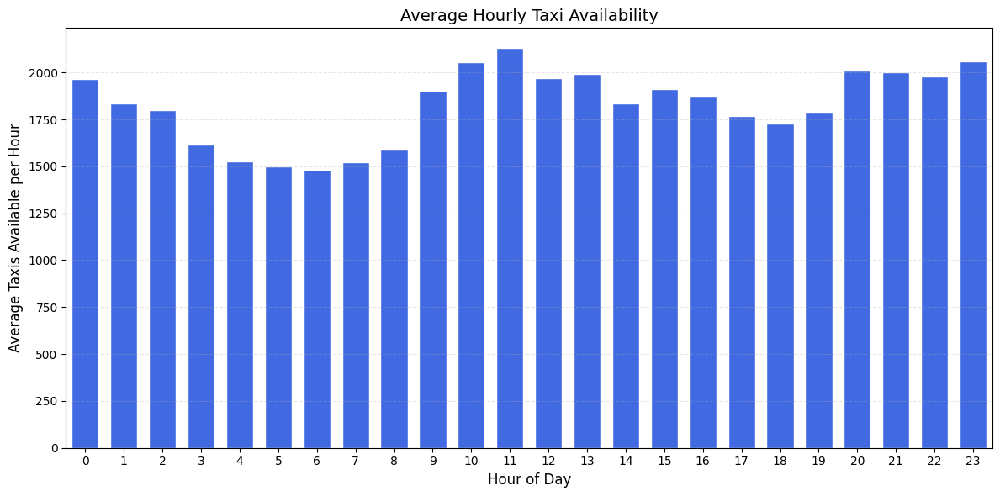

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Extract hour and date from datetime
plt_taxi_data = taxi_data.copy()
plt_taxi_data['hour'] = plt_taxi_data['datetime'].dt.hour
plt_taxi_data['date'] = plt_taxi_data['datetime'].dt.date  # Extract date (without time)

# 2. Count records per hour per day
hourly_counts_per_day = (
    plt_taxi_data.groupby(['date', 'hour'])
    .size()                # Count records per hour per day
    .rename('count')       # Rename the count column
    .reset_index()
)

# 3. Calculate average per hour (and divide by 2 for two records per hour)
hourly_avg = (
    hourly_counts_per_day.groupby('hour')['count']
    .mean()                # Average across days
    .div(2)                # Divide by 2 (two records per hour)
    .sort_index()          # Order by hour (0-23)
)

# 4. Create the plot
plt.figure(figsize=(12, 6))
bars = plt.bar(
    hourly_avg.index,
    hourly_avg.values,
    color='royalblue',
    width=0.7,
    edgecolor='white'
)

# 5. Customize the plot
plt.title('Average Hourly Taxi Availability', fontsize=14)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Average Taxis Available per Hour', fontsize=12)
plt.xticks(range(0, 24))
plt.xlim(-0.5, 23.5)
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

# Where are the most common pickup locations at peak hour?


In [ ]:
# Filter only 11 AM records (without creating 'hour' column)
df_11am = taxi_data[taxi_data['datetime'].dt.hour == 11].copy()
df_11am

,longitude,latitude,datetime
29760,103.642050,1.328760,2024-01-01 11:30:00
29761,103.688780,1.340000,2024-01-01 11:30:00
29762,103.689284,1.341181,2024-01-01 11:30:00
29763,103.690090,1.324520,2024-01-01 11:30:00
29764,103.692870,1.338800,2024-01-01 11:30:00
...,...,...,...
10563805,103.990400,1.360790,2024-04-30 11:30:00
10563806,103.990405,1.357496,2024-04-30 11:30:00
10563807,103.990685,1.357517,2024-04-30 11:30:00
10563808,103.990770,1.358160,2024-04-30 11:30:00


In [ ]:
#Plot maps
from bokeh.io import output_notebook
output_notebook()
from bokeh.io import show
from bokeh.plotting import gmap
from bokeh.models import GMapOptions
from bokeh.models import ColumnDataSource
from google.colab import userdata
GMAP = userdata.get('GMAP')

api_key = GMAP
LAT = 1.35
LOT = 103.8
ZOOM = 11
MAP_TYPE = "road"

gmap_options = GMapOptions(lat=LAT, lng=LOT, zoom=ZOOM)
sg_map = gmap(api_key, gmap_options, title='SG_TAXI',width = 700, height = 400)
#plot
sg_map.scatter(x='longitude', y='latitude', size=2,alpha=0.005, color='blue', source=ColumnDataSource(df_11am))

show(sg_map)


# How does weekday vs weekend availability compare?

<ipython-input-12-124ea47aa973>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='hour', y='day_type', data=taxi_data, palette='Set2')


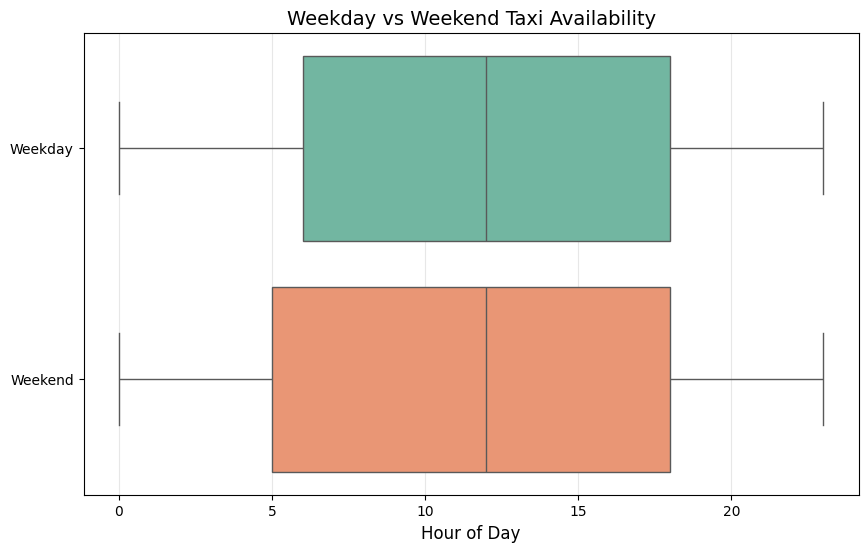

In [ ]:
import seaborn as sns

# Add weekday/weekend flag
taxi_data['day_type'] = taxi_data['datetime'].dt.dayofweek.apply(
    lambda x: 'Weekend' if x >= 5 else 'Weekday'
)
taxi_data['hour'] = taxi_data['datetime'].dt.hour

# Plot comparison
plt.figure(figsize=(10, 6))
sns.boxplot(x='hour', y='day_type', data=taxi_data, palette='Set2')
plt.title('Weekday vs Weekend Taxi Availability', fontsize=14)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('')
plt.grid(axis='x', alpha=0.3)
plt.show()

Group by period

ANOVA Results:
F-statistic: 135.38, p-value: 0.0000


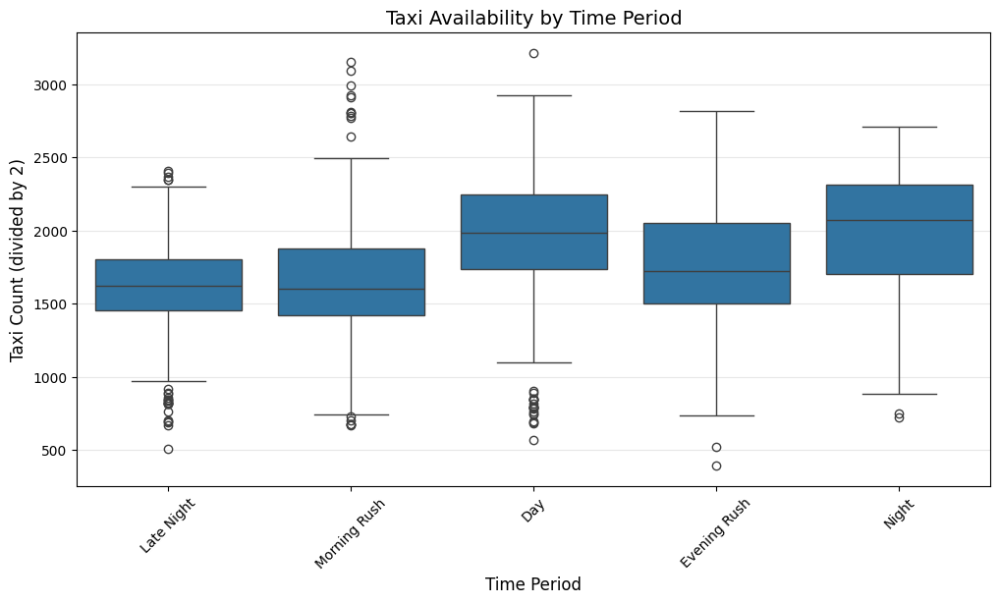

In [ ]:
from scipy import stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.stats.multicomp import pairwise_tukeyhsd

hourly_stats = taxi_data.groupby(
    [taxi_data['datetime'].dt.date.rename('date'),  # Rename the date grouping
     taxi_data['datetime'].dt.hour.rename('hour')]  # Rename the hour grouping
).agg(
    count=('longitude', lambda x: x.size / 2),      # Count of taxis available divided by 2
    avg_longitude=('longitude', 'mean'),           # Average longitude
    avg_latitude=('latitude', 'mean'),             # Average latitude
    location_std=('longitude', lambda x: np.std(x)**2 + np.std(taxi_data.loc[x.index, 'latitude'])**2)
).reset_index()

# 1. First ensure our period classification is correct
hourly_stats['period'] = pd.cut(hourly_stats['hour'],
                              bins=[0, 6, 9, 16, 19, 23],
                              labels=['Late Night', 'Morning Rush', 'Day', 'Evening Rush', 'Night'],
                              ordered=False)

# 2. Create a numeric encoding for the periods
period_order = ['Late Night', 'Morning Rush', 'Day', 'Evening Rush', 'Night']
hourly_stats['period_code'] = hourly_stats['period'].apply(lambda x: period_order.index(x))

# 3. Perform ANOVA
anova_groups = [hourly_stats[hourly_stats['period_code'] == i]['count'] for i in range(5)]
anova_result = stats.f_oneway(*anova_groups)
print(f"ANOVA Results:\nF-statistic: {anova_result.statistic:.2f}, p-value: {anova_result.pvalue:.4f}")

# Additional Visualization
plt.figure(figsize=(12, 6))
sns.boxplot(x='period', y='count', data=hourly_stats, order=period_order)
plt.title('Taxi Availability by Time Period', fontsize=14)
plt.xlabel('Time Period', fontsize=12)
plt.ylabel('Taxi Count (divided by 2)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.show()

# Distribution Analysis with Visualization

In [ ]:
hourly_stats

,date,hour,count,avg_longitude,avg_latitude,location_std,period,period_code
0,2024-01-01,0,1324.5,103.856273,1.347059,0.007370,NaN,NaN
1,2024-01-01,1,1155.5,103.851440,1.353946,0.007299,Late Night,0
2,2024-01-01,2,1402.5,103.843654,1.359366,0.007157,Late Night,0
3,2024-01-01,3,1406.0,103.843390,1.360519,0.007563,Late Night,0
4,2024-01-01,4,1281.5,103.846798,1.358954,0.007268,Late Night,0
...,...,...,...,...,...,...,...,...
2899,2024-04-30,19,1501.5,103.864618,1.347116,0.008084,Evening Rush,3
2900,2024-04-30,20,1970.0,103.872116,1.348369,0.007781,Night,4
2901,2024-04-30,21,2010.5,103.865635,1.352195,0.007905,Night,4
2902,2024-04-30,22,1995.5,103.870254,1.352347,0.008324,Night,4


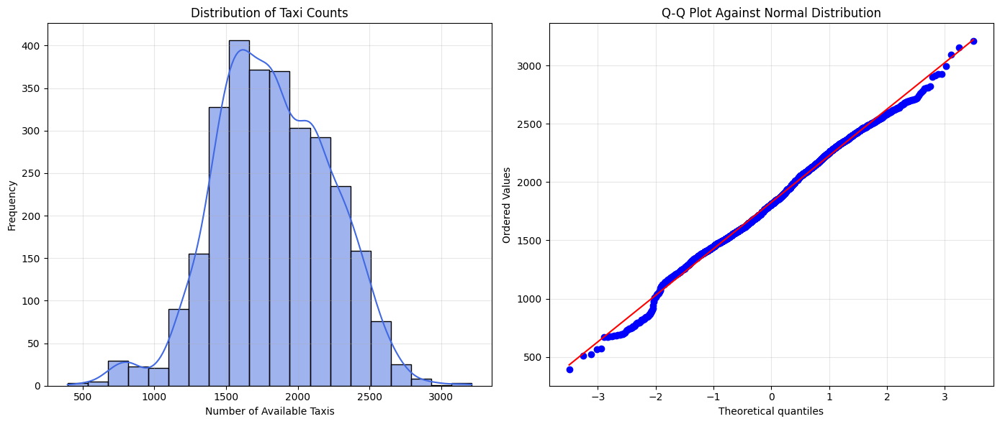

In [ ]:
plt.figure(figsize=(14, 6))

# Histogram with KDE
plt.subplot(1, 2, 1)
sns.histplot(hourly_stats['count'], kde=True, bins=20, color='royalblue')
plt.title('Distribution of Taxi Counts')
plt.xlabel('Number of Available Taxis')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)

# QQ-Plot
plt.subplot(1, 2, 2)
stats.probplot(hourly_stats['count'], dist="norm", plot=plt)
plt.title('Q-Q Plot Against Normal Distribution')
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

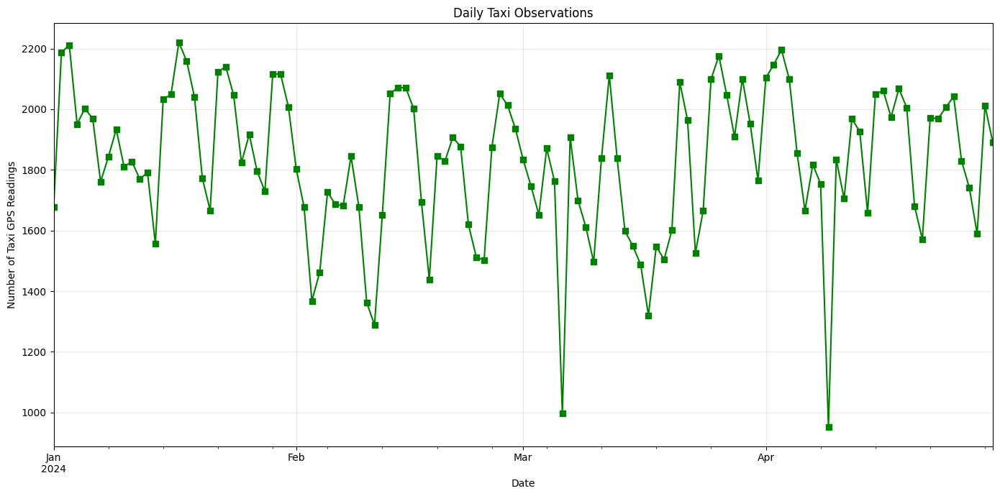

In [ ]:
# Assuming your data has coordinates but no explicit count column
taxi_data['datetime'] = pd.to_datetime(taxi_data['datetime'])  # Ensure datetime type
daily_counts = (taxi_data.groupby(pd.Grouper(key='datetime', freq='D')).size())/48

plt.figure(figsize=(14, 7))
daily_counts.plot(color='green', marker='s', linestyle='-',
                 title='Daily Taxi Observations',
                 xlabel='Date', ylabel='Number of Taxi GPS Readings')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

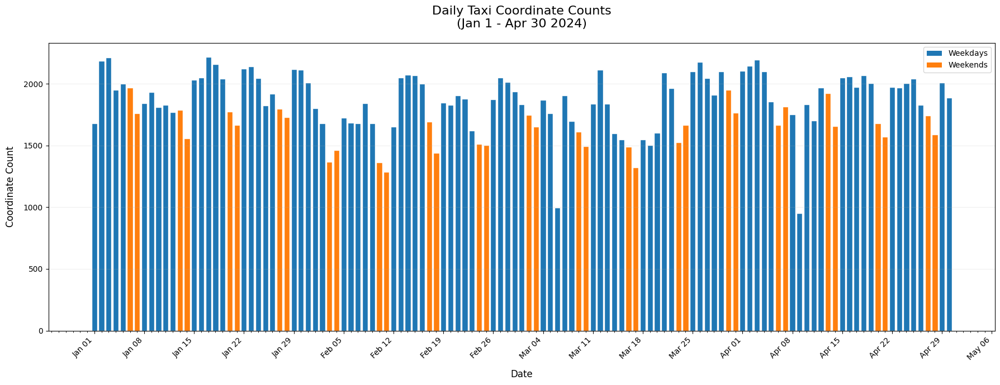

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.patches import Patch

# Assuming daily_counts is your Series with DatetimeIndex
plt.figure(figsize=(18, 7))

# Convert to DataFrame for easier handling (if needed)
df = daily_counts.reset_index()
df.columns = ['date', 'count']

# Create the bar plot
bars = plt.bar(
    df['date'],
    df['count'],
    color=['#ff7f0e' if date.weekday() >= 5 else '#1f77b4' for date in df['date']],
    width=0.8,
    edgecolor='white'
)

# Date formatting
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))  # Weekly ticks
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))  # "Apr 01" format
ax.xaxis.set_minor_locator(mdates.DayLocator(interval=1))

# Styling
plt.title('Daily Taxi Coordinate Counts\n(Jan 1 - Apr 30 2024)', fontsize=16, pad=20)
plt.xlabel('Date', fontsize=12, labelpad=10)
plt.ylabel('Coordinate Count', fontsize=12, labelpad=10)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.2)

# Custom legend
legend_elements = [
    Patch(facecolor='#1f77b4', label='Weekdays'),
    Patch(facecolor='#ff7f0e', label='Weekends')
]
plt.legend(handles=legend_elements, loc='upper right')

# Adjust layout to prevent cut-off
plt.tight_layout()
plt.show()

# Prediction with ML

In [ ]:
taxi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10607231 entries, 0 to 10607230
Data columns (total 5 columns):
 #   Column     Dtype         
---  ------     -----         
 0   longitude  float64       
 1   latitude   float64       
 2   datetime   datetime64[us]
 3   day_type   object        
 4   hour       int32         
dtypes: datetime64[us](1), float64(2), int32(1), object(1)
memory usage: 364.2+ MB


In [ ]:
# Create daily average counts (count/48)
daily_avg_counts = (
    taxi_data.groupby(taxi_data['datetime'].dt.date)  # Group by date
    .agg(
        total_count=('longitude', 'size'),  # Total raw count
        avg_count=('longitude', lambda x: x.size / 48),  # Average per time period
        avg_longitude=('longitude', 'mean'),
        avg_latitude=('latitude', 'mean')
    )
    .reset_index()
    .rename(columns={'datetime': 'date'})
)

# Convert to datetime and add date features
daily_avg_counts['date'] = pd.to_datetime(daily_avg_counts['date'])
daily_avg_counts['day_of_week'] = daily_avg_counts['date'].dt.dayofweek
daily_avg_counts['day_name'] = daily_avg_counts['date'].dt.day_name()
daily_avg_counts['month'] = daily_avg_counts['date'].dt.month

# Show results
print(daily_avg_counts.head())

        date  total_count    avg_count  avg_longitude  avg_latitude  \
0 2024-01-01        80541  1677.937500     103.850814      1.354064   
1 2024-01-02       104979  2187.062500     103.851085      1.347792   
2 2024-01-03       106165  2211.770833     103.853283      1.347090   
3 2024-01-04        93655  1951.145833     103.854085      1.348203   
4 2024-01-05        96122  2002.541667     103.857879      1.347217   

   day_of_week   day_name  month  
0            0     Monday      1  
1            1    Tuesday      1  
2            2  Wednesday      1  
3            3   Thursday      1  
4            4     Friday      1  


In [ ]:
import pandas as pd
import numpy as np
from prophet import Prophet
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt

# Prepare your DataFrame: rename columns to match Prophet requirements
daily = daily_avg_counts.copy()
daily.rename(columns={'date': 'ds', 'avg_count': 'y'}, inplace=True)
daily = daily.sort_values('ds').reset_index(drop=True)

# Split into training and test sets (e.g., 80% training, 20% test)
split_index = int(len(daily) * 0.8)
train = daily.iloc[:split_index].reset_index(drop=True)
test = daily.iloc[split_index:].reset_index(drop=True)

# -------------------------------
# Step 1: Fit a Prophet Model
# -------------------------------
# We enable weekly seasonality as it can capture patterns in daily data
prophet_model = Prophet(weekly_seasonality=True, daily_seasonality=True, yearly_seasonality=False)

prophet_model.add_country_holidays(country_name='SG')  # Singapore holidays
prophet_model.fit(train)


# Create a DataFrame for the entire period (training + forecast horizon)
horizon = len(test)  # number of periods to forecast
future = prophet_model.make_future_dataframe(periods=horizon, freq='D')

# Get the forecast from Prophet (includes forecasted yhat and decomposed components)
forecast = prophet_model.predict(future)

# -------------------------------
# Step 2: Feature Engineering
# -------------------------------
# Select key columns from Prophet’s output
forecast_feats = forecast[['ds', 'yhat', 'trend', 'weekly']]

# Merge these forecast components back into the original data
train_feats = pd.merge(train, forecast_feats, on='ds', how='left')
test_feats = pd.merge(test, forecast_feats, on='ds', how='left')

# Create a one-day lag of your actual target (avg_count) as an extra feature
train_feats['y_lag1'] = train_feats['y'].shift(1)
test_feats['y_lag1'] = test_feats['y'].shift(1)

# Drop missing values (the first row from each set due to lag)
train_feats.dropna(inplace=True)
test_feats.dropna(inplace=True)

# Define feature columns for LightGBM. You can experiment by adding or changing features.
feature_cols = ['yhat', 'trend', 'weekly', 'y_lag1','day_of_week']

X_train = train_feats[feature_cols]
y_train = train_feats['y']
X_test = test_feats[feature_cols]
y_test = test_feats['y']

# -------------------------------
# Step 3: Train a LightGBM Regressor
# -------------------------------
lgb_model = lgb.LGBMRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
lgb_model.fit(X_train, y_train)

# Predict on the test set
preds = lgb_model.predict(X_test)

# Evaluate performance (using Mean Absolute Error)
mae = mean_absolute_error(y_test, preds)
print(f"Hybrid Prophet + LightGBM MAE: {mae:.2f}")



DEBUG:cmdstanpy:input tempfile: /tmp/tmpvo2xgv01/_6qzvxj0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvo2xgv01/fg4v6frm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68574', 'data', 'file=/tmp/tmpvo2xgv01/_6qzvxj0.json', 'init=/tmp/tmpvo2xgv01/fg4v6frm.json', 'output', 'file=/tmp/tmpvo2xgv01/prophet_modelln98tkfa/prophet_model-20250417043544.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
04:35:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:35:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 140
[LightGBM] [Info] Number of data points in the train set: 95, number of used features: 5
[LightGBM] [Info] Start training from score 1826.970614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

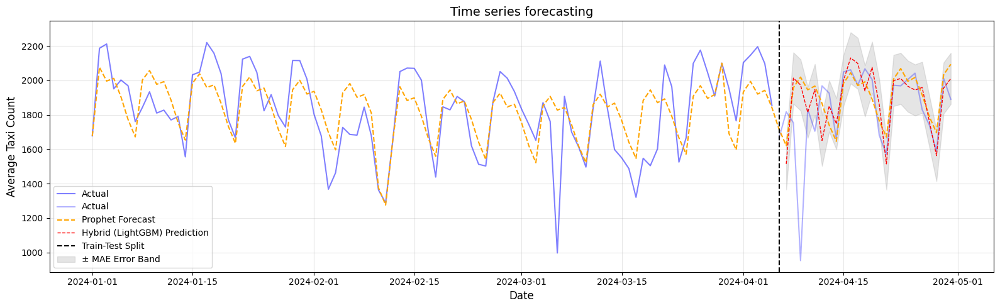

In [ ]:
plt.figure(figsize=(16, 5))

# 1. Plot training data (actual values)
plt.plot(train['ds'], train['y'],
         label='Actual', color='blue', alpha=0.5, marker='')
# 2. Plot test data (actual values)
plt.plot(test['ds'], test['y'],
         label='Actual', color='blue', alpha=0.3, marker='')
# 3. Plot Prophet's forecast (baseline)
plt.plot(forecast['ds'], forecast['yhat'],
         label='Prophet Forecast', color='orange', linestyle='--')
# 4. Plot Hybrid Model (LightGBM) predictions
plt.plot(test_feats['ds'], preds,
         label='Hybrid (LightGBM) Prediction', color='red', linestyle='--', linewidth=1)
# 5. Highlight train-test split
split_date = test['ds'].iloc[0]
plt.axvline(x=split_date, color='black', linestyle='--',
            label='Train-Test Split')
# 6. Add error band for hybrid model
mae = mean_absolute_error(y_test, preds)
plt.fill_between(test_feats['ds'],
                 preds - mae,
                 preds + mae,
                 color='gray', alpha=0.2,
                 label='± MAE Error Band')
# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Average Taxi Count', fontsize=12)
plt.title('Time series forecasting', fontsize=14)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Recommendations

1.  **Taxi Fleet Optimization**:
    -   Increase taxi deployment in underserved residential areas (Woodlands, Jurong West) during off-peak hours to reduce wait times.
    -   Based on real-time demand, redirect taxis to high-density areas like the (Orchard) during peak hours.
    -   Encourage drivers to serve airport routes (Changi) during flight arrival peaks, as indicated by taxi clustering.
2.  **Urban Planning**:
    -   Use taxi density data to inform public transport planning, such as adding bus routes in areas with low taxi availability.
    -   Integrate taxi availability data with traffic and event data to predict demand surges like during concerts or public holidays.